# Realistic Loan Approval Dataset | US & Canada


In [1]:
#import needed python libraries
import numpy as np, pandas as pd, plotly.express as px, matplotlib.pyplot as plt, seaborn as sns

In [2]:
Loan_df = pd.read_csv("Loan_approval_data_2025.csv")

In [3]:
Loan_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   customer_id              50000 non-null  object 
 1   age                      50000 non-null  int64  
 2   occupation_status        50000 non-null  object 
 3   years_employed           50000 non-null  float64
 4   annual_income            50000 non-null  int64  
 5   credit_score             50000 non-null  int64  
 6   credit_history_years     50000 non-null  float64
 7   savings_assets           50000 non-null  int64  
 8   current_debt             50000 non-null  int64  
 9   defaults_on_file         50000 non-null  int64  
 10  delinquencies_last_2yrs  50000 non-null  int64  
 11  derogatory_marks         50000 non-null  int64  
 12  product_type             50000 non-null  object 
 13  loan_intent              50000 non-null  object 
 14  loan_amount           

In [4]:
pivot_data = Loan_df.loc[Loan_df['loan_status'] == 1, 
                         ['loan_intent', 
                          'product_type', 
                          'occupation_status', 
                          'loan_status', 
                          'loan_amount', 
                          'interest_rate']]

In [5]:
pivot_data

,loan_intent,product_type,occupation_status,loan_status,loan_amount,interest_rate
0,Business,Credit Card,Employed,1,600,17.02
2,Debt Consolidation,Credit Card,Student,1,2100,18.33
3,Business,Credit Card,Student,1,2900,18.74
4,Education,Personal Loan,Employed,1,99600,13.92
6,Home Improvement,Personal Loan,Employed,1,45600,11.02
...,...,...,...,...,...,...
49986,Medical,Credit Card,Employed,1,70000,17.04
49988,Business,Credit Card,Student,1,6800,14.86
49989,Education,Credit Card,Employed,1,35900,17.31
49993,Personal,Credit Card,Employed,1,2400,18.06


In [6]:
df_pivot = pd.pivot_table(data=pivot_data, 
                          index=['loan_intent', 'product_type'],
                          columns=['occupation_status'],
                          values=['interest_rate'],
                          aggfunc={'interest_rate': 'mean'})

df_pivot = df_pivot.round(2)

#loan_cols = [col for col in df_pivot.columns if 'loan_amount' in col]
#df_pivot[loan_cols] = df_pivot[loan_cols].applymap(lambda x: f"{x:,.2f}" if pd.notnull(x) else "")

In [7]:
df_pivot

interest_rate                      
occupation_status                      Employed Self-Employed Student
loan_intent        product_type                                      
Business           Credit Card            17.96         17.77   18.47
                   Line of Credit          9.69          9.74    9.96
                   Personal Loan          11.69         11.36   11.52
Debt Consolidation Credit Card            17.73         17.76   18.32
                   Line of Credit          9.61          9.61    9.19
                   Personal Loan          11.17         11.27   11.05
Education          Credit Card            18.64         18.59   19.09
                   Line of Credit         10.49         10.38   10.71
                   Personal Loan          12.38         12.43   12.27
Home Improvement   Credit Card            18.20         18.07   18.89
                   Line of Credit          9.87         10.16    9.73
                   Personal Loan          11.85         11.82   11.55
Medical            Credit Card            18.27         18.09   18.98
                   Line of Credit          9.89         10.11    9.94
                   Personal Loan          11.83         11.88   11.69
Personal           Credit Card            18.43         18.42   18.99
                   Line of Credit         10.30         10.40   10.51
                   Personal Loan          12.11         12.06   12.03

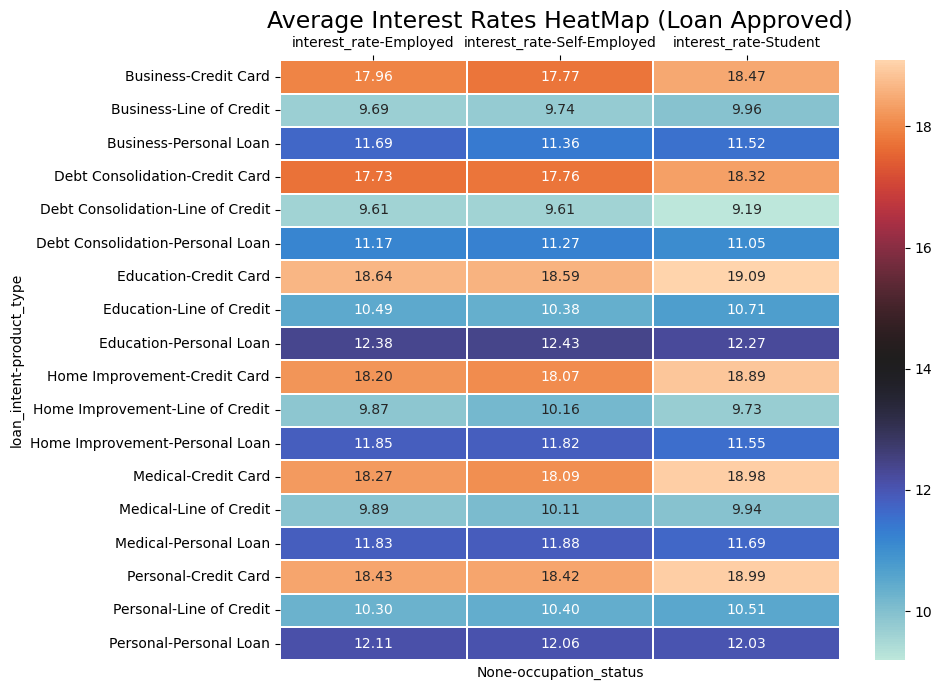

In [8]:
fig1, ax = plt.subplots(figsize=(10,7))

sns.heatmap(data=df_pivot, 
            annot=True, 
            linewidths=.2, 
            cmap='icefire', 
            fmt=".2f", 
            ax=ax)

ax.xaxis.tick_top()  # Move x-axis labels to the top
plt.title("Average Interest Rates HeatMap (Loan Approved)", fontsize= 17)
fig1.tight_layout()
plt.show()

### Insight
- Heatmap shows the average interest rate paid by loans across the category matrix
- Line of credit interest rates are the lowest rates on average (good for consumers to know - so they will choose this over other product types)
- Credit Cards will charge the highest interest rate on average (on approved loans)

In [9]:
df_pivot2 = pd.pivot_table(data=pivot_data, 
                          index=['loan_intent', 'product_type'],
                          columns=['occupation_status'],
                          values=['loan_amount'],
                          aggfunc={'loan_amount': 'mean'})

df_pivot2 = df_pivot2.round(2)
#loan_cols = [col for col in df_pivot2.columns if 'loan_amount' in col]
#df_pivot2[loan_cols] = df_pivot2[loan_cols].map(lambda x: f"{x:,.2f}" if pd.notnull(x) else "")

In [10]:
df_pivot2

loan_amount                        
occupation_status                    Employed Self-Employed   Student
loan_intent        product_type                                      
Business           Credit Card       30979.08      39116.09   2273.04
                   Line of Credit    21961.63      26681.48  11792.59
                   Personal Loan     44520.86      49087.61  13625.00
Debt Consolidation Credit Card       32381.40      34702.26   2569.74
                   Line of Credit    22851.05      27409.20  11963.16
                   Personal Loan     46117.17      43579.82  23390.32
Education          Credit Card       30595.56      39117.84   2452.02
                   Line of Credit    22047.12      25961.90  11209.68
                   Personal Loan     44384.12      53688.79  23125.27
Home Improvement   Credit Card       31199.12      37200.72   2522.40
                   Line of Credit    22551.91      26905.81  10963.79
                   Personal Loan     43448.68      53478.57  19121.25
Medical            Credit Card       31375.65      37156.60   2426.38
                   Line of Credit    21928.42      24969.01  12056.58
                   Personal Loan     46150.42      49464.53  19283.33
Personal           Credit Card       30960.36      37272.15   2444.92
                   Line of Credit    22435.18      27925.84  12266.89
                   Personal Loan     44474.85      54759.41  17696.79

C:\Users\tishs\AppData\Local\Temp\ipykernel_19264\1904157363.py:3: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  annot = df_pivot2.applymap(lambda x: f"{x:,.2f}")


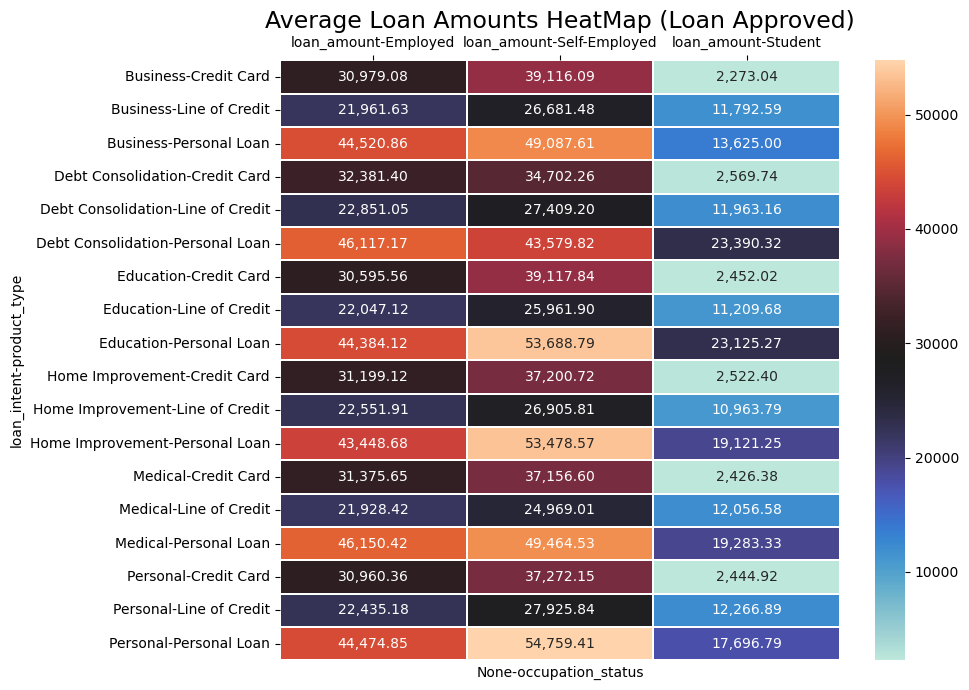

In [11]:
fig1, ax = plt.subplots(figsize=(10,7))

annot = df_pivot2.applymap(lambda x: f"{x:,.2f}")
sns.heatmap(data=df_pivot2,
             annot=annot, 
             linewidths=.2, 
             cmap='icefire', 
             fmt='', 
             ax=ax)

ax.xaxis.tick_top()  # Move x-axis labels to the top
plt.title("Average Loan Amounts HeatMap (Loan Approved)", fontsize= 17)
fig1.tight_layout()
plt.show()

### Insight
- Heatmap shows students are granted lower loan amounts overall - perhap use this with the above heatmap to show students are favoured overall when applying for loans
- Self-employed are the heaviest borrowers overall - personal loans highlighted as their main loan source for approved loans
- When compared to interest rate this heatmap shows more ambiguity across product types and loan intent whereas loan interest within the same occupation status is more uniform. There it's more driven by loan intent and product type 

In [12]:
fig2 = px.scatter(Loan_df, x='debt_to_income_ratio', 
                  y='loan_to_income_ratio', 
                  color='payment_to_income_ratio', 
                  title="Debt-to-Income vs Loan-to-Income")
fig2.show()

### Insight
- Even distribution of payment-to-income ratio across the debt/income and loan/income graph - so much so the graph itself mirrors the payment/income legend
- Meaning debt/income isn't a factor, whereas loan/income and payment/income are linked - greater the loan compared to borrower's income - means bigger payments in relation to what the borrower makes annually.

In [13]:
fig3 = px.scatter(Loan_df, x='loan_amount', 
                  y='annual_income', 
                  color='interest_rate', 
                  title="Loan Amount vs Annual Income")
fig3.show()

### Insight
- Lower loan amount and lower annual income means higher interest is applied to these loans
- Once the loan reaches 70k and above, annual income becomes a less important factor - reduction on interest rates on these loans
- Before 75k mark reached, higher the annual income will see general reduction in loan interest rates applied

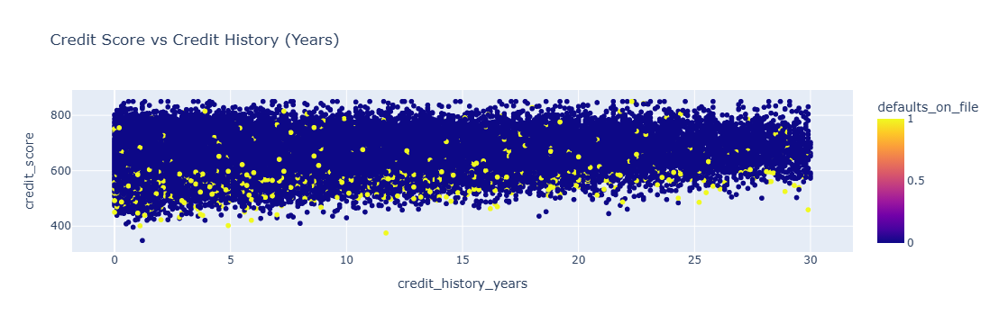

In [14]:
fig4 = px.scatter(Loan_df, x='credit_history_years', 
                  y='credit_score', 
                  color='defaults_on_file', 
                  title="Credit Score vs Credit History (Years)")
fig4.show()

### Insights
- Higher credit scores for longer credit history as expected (grouping trending upwards)
- Still some defaults on file for higher credit history but very little when it reaches 800+ in comparison to lower credit scores where yellow dots are more prevalent

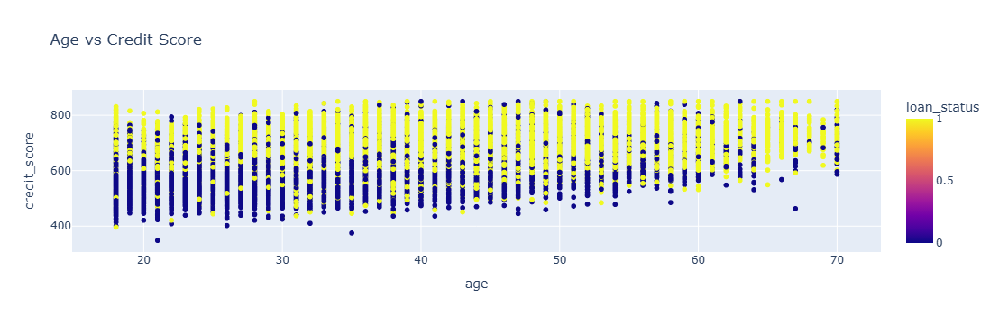

In [15]:
fig4 = px.scatter(Loan_df, x='age', 
                  y='credit_score', 
                  color='loan_status', 
                  title="Age vs Credit Score")
fig4.show()

### Insights
- Higher the age with higher credit scores means loan approval is most frequent
- Below the mid credit score range (around 600) loan approvel falls as fewer loans are approved - age is a main factor with more refusals in he 20-35 age range.

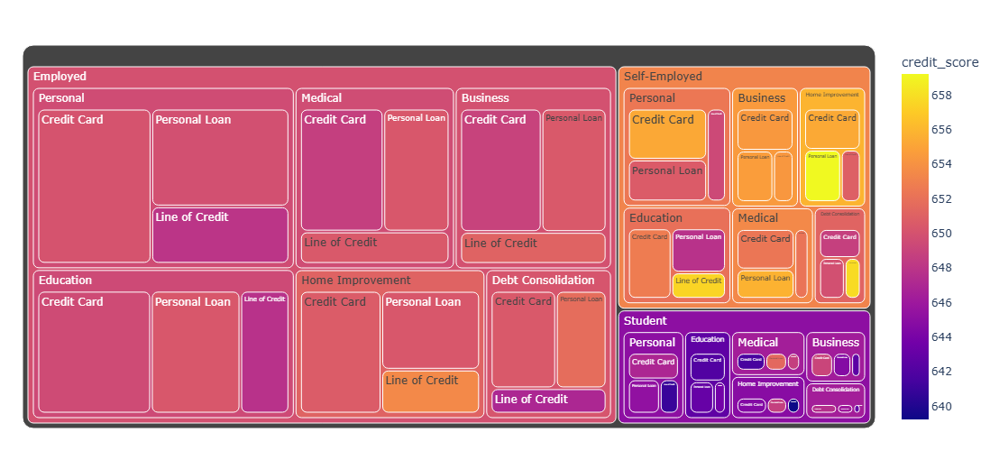

In [28]:
fig5 = px.treemap(
    data_frame=Loan_df,
    path=['occupation_status',
          'loan_intent',
          'product_type'], 
            values='credit_score',
            color='credit_score', 
            hover_name='credit_score', 
    hover_data=['credit_score']
)
fig5.update_layout(title="")
fig5.update_traces(marker=dict(cornerradius=12)) 
fig5.update_layout(
    width=1000,    # Increase width in px
    height=500,    # Optionally adjust height
    margin=dict(t=50, l=25, r=25, b=25)
)
fig5.update_layout(showlegend=True)
fig5.show()

### Insights
- Banks will grant loans to those with higher credit scores - here we are looking at mid-range credit scores (640 - 658)
- The above treemap uses categories: occupation status, loan intent and product type to show key areas of credit scoring distribution
- Shows students generally have a lower credit score so there's more default risk (as 600 is still high)
- Shows those using loan for home improvement (taking out a personal loan) as having the best credit scores, same for debt consol by lines of credit
- The self-employed occupation status overall has best credit scores.    